# Initialization

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from distfit import distfit
from scipy import stats
import pickle
from SkillingsMack import cMackSkil
from collections import Counter

# import itertools
# import math
# import seaborn as sns
# import random
# import scikit_posthocs

In [2]:
# Here I load my data
with open(r'atari_100k\OTRainbow.json') as ff:
    a100 = json.load(ff)
rain_ret = a100

der_ret = dict()
for root, dirs, files in os.walk(r"atari_100k\DER"):
    for file in files:
        if file.endswith(".json"):
            with open(os.path.join(root, file)) as ff:
                a100 = json.load(ff)
                der_ret.update({file[:-5]: [i['eval_average_return'] for i in a100]})

curl_ret = dict()
for root, dirs, files in os.walk(r"atari_100k\CURL"):
    for file in files:
        if file.endswith(".json"):
            with open(os.path.join(root, file)) as ff:
                a100 = json.load(ff)
                curl_ret.update({file[:-5]: [i['eval_average_return'] for i in a100]})

with open(r'atari_100k\SPR.json') as ff:
    a100 = json.load(ff)
spr_ret = a100

with open(r'atari_100k\DrQ.json') as ff:
    a100 = json.load(ff)
drq_ret = a100

with open(r'atari_100k\DrQ(eps).json') as ff:
    a100 = json.load(ff)
drqeps_ret = a100

algo_bench = {'CURL': curl_ret, 'DER': der_ret, 'DrQ': drq_ret, 'DrQ(eps)': drqeps_ret, 'OTR': rain_ret, 'SPR': spr_ret}
games = list(rain_ret.keys())

In [3]:

#@title Record scores on Atari games
record_scores = False

ALL_HUMAN_RECORD = {
  'Alien': 251916.0,
  'Amidar': 104159.0,
  'Assault': 8647.0,
  'Asterix': 1000000.0,
  'Asteroids': 10506650.0,
  'Atlantis': 10604840.0,
  'BankHeist': 82058.0,
  'BattleZone': 801000.0,
  'BeamRider': 999999.0,
  'Berzerk': 1057940.0,
  'Bowling': 300.0,
  'Boxing': 100.0,
  'Breakout': 864.0,
  'Centipede': 1301709.0,
  'ChopperCommand': 999999.0,
  'CrazyClimber': 219900.0,
  'DemonAttack': 1556345.0,
  'DoubleDunk': 22.0,
  'Enduro': 9500.0,
  'FishingDerby': 71.0,
  'Freeway': 38.0,
  'Frostbite': 454830.0,
  'Gopher': 355040.0,
  'Gravitar': 162850.0,
  'Hero': 1000000.0,
  'IceHockey': 36.0,
  'Jamesbond': 45550.0,
  'Kangaroo': 1424600.0,
  'Krull': 104100.0,
  'KungFuMaster': 1000000.0,
  'MontezumaRevenge': 1219200.0,
  'MsPacman': 290090.0,
  'NameThisGame': 25220.0,
  'Phoenix': 4014440.0,
  'Pitfall': 114000.0,
  'Pong': 21.0,
  'PrivateEye': 101800.0,
  'Qbert': 2400000.0,
  'Riverraid': 1000000.0,
  'RoadRunner': 2038100.0,
  'Robotank': 76.0,
  'Seaquest': 999999.0,
  'Skiing': -3272.0,
  'Solaris': 111420.0,
  'SpaceInvaders': 621535.0,
  'StarGunner': 77400.0,
  'Tennis': 21.0,
  'TimePilot': 65300.0,
  'Tutankham': 5384.0,
  'UpNDown': 82840.0,
  'Venture': 38900.0,
  'VideoPinball': 89218328.0,
  'WizardOfWor': 395300.0,
  'YarsRevenge': 15000105.0,
  'Zaxxon': 83700.0,
  'AirRaid': 23050.0,
  'Carnival': 2541440.0,
  'ElevatorAction': 156550.0,
  'JourneyEscape': -4317804.0,
  'Pooyan': 13025.0
}
RANDOM_SCORES = {
 'Alien': 227.8,
 'Amidar': 5.8,
 'Assault': 222.4,
 'Asterix': 210.0,
 'BankHeist': 14.2,
 'BattleZone': 2360.0,
 'Boxing': 0.1,
 'Breakout': 1.7,
 'ChopperCommand': 811.0,
 'CrazyClimber': 10780.5,
 'DemonAttack': 152.1,
 'Freeway': 0.0,
 'Frostbite': 65.2,
 'Gopher': 257.6,
 'Hero': 1027.0,
 'Jamesbond': 29.0,
 'Kangaroo': 52.0,
 'Krull': 1598.0,
 'KungFuMaster': 258.5,
 'MsPacman': 307.3,
 'Pong': -20.7,
 'PrivateEye': 24.9,
 'Qbert': 163.9,
 'RoadRunner': 11.5,
 'Seaquest': 68.4,
 'UpNDown': 533.4
}

HUMAN_SCORES = {
 'Alien': 7127.7,
 'Amidar': 1719.5,
 'Assault': 742.0,
 'Asterix': 8503.3,
 'BankHeist': 753.1,
 'BattleZone': 37187.5,
 'Boxing': 12.1,
 'Breakout': 30.5,
 'ChopperCommand': 7387.8,
 'CrazyClimber': 35829.4,
 'DemonAttack': 1971.0,
 'Freeway': 29.6,
 'Frostbite': 4334.7,
 'Gopher': 2412.5,
 'Hero': 30826.4,
 'Jamesbond': 302.8,
 'Kangaroo': 3035.0,
 'Krull': 2665.5,
 'KungFuMaster': 22736.3,
 'MsPacman': 6951.6,
 'Pong': 14.6,
 'PrivateEye': 69571.3,
 'Qbert': 13455.0,
 'RoadRunner': 7845.0,
 'Seaquest': 42054.7,
 'UpNDown': 11693.2
}

NORM_BASELINE = ALL_HUMAN_RECORD if record_scores else HUMAN_SCORES 

def score_normalization(scores, min_scores, max_scores):
  # min should be random scores, max should be human scores.
  norm_scores = np.divide(np.subtract(scores, min_scores), max_scores - min_scores)
  return norm_scores

# Data and distribution obtained by merging across algorithms scores

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 90.1624] [loc=0.069 scale=0.025]
[distfit] >INFO> [expon     ] [0.0 sec] [RSS: 1866.63] [loc=-0.004 scale=0.073]
[distfit] >INFO> [pareto    ] [0.01 sec] [RSS: 1866.63] [loc=-4194304.004 scale=4194304.000]
[distfit] >INFO> [dweibull  ] [0.08 sec] [RSS: 31.7682] [loc=0.068 scale=0.019]
[distfit] >INFO> [t         ] [0.49 sec] [RSS: 25.2992] [loc=0.068 scale=0.019]
[distfit] >INFO> [genextreme] [0.27 sec] [RSS: 73.4997] [loc=0.059 scale=0.022]
[distfit] >INFO> [gamma     ] [0.11 sec] [RSS: 55.2556] [loc=-0.033 scale=0.006]
[distfit] >INFO> [lognorm   ] [0.09 sec] [RSS: 51.5778] [loc=-0.068 scale=0.135]
[distfit] >INFO> [beta      ] [0.49 sec] [RSS: 60.0164] [loc=-0.027 scale=22301.408]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 1833.58] [loc=-0.004 scale=0.255]
[distfit] >INFO> [loggamma  ] [0.19 sec] [RSS: 106.042] [loc=-8.854 scale=1.166]
[distfit] >INFO> fit
[distfit] >INFO> transform
[d

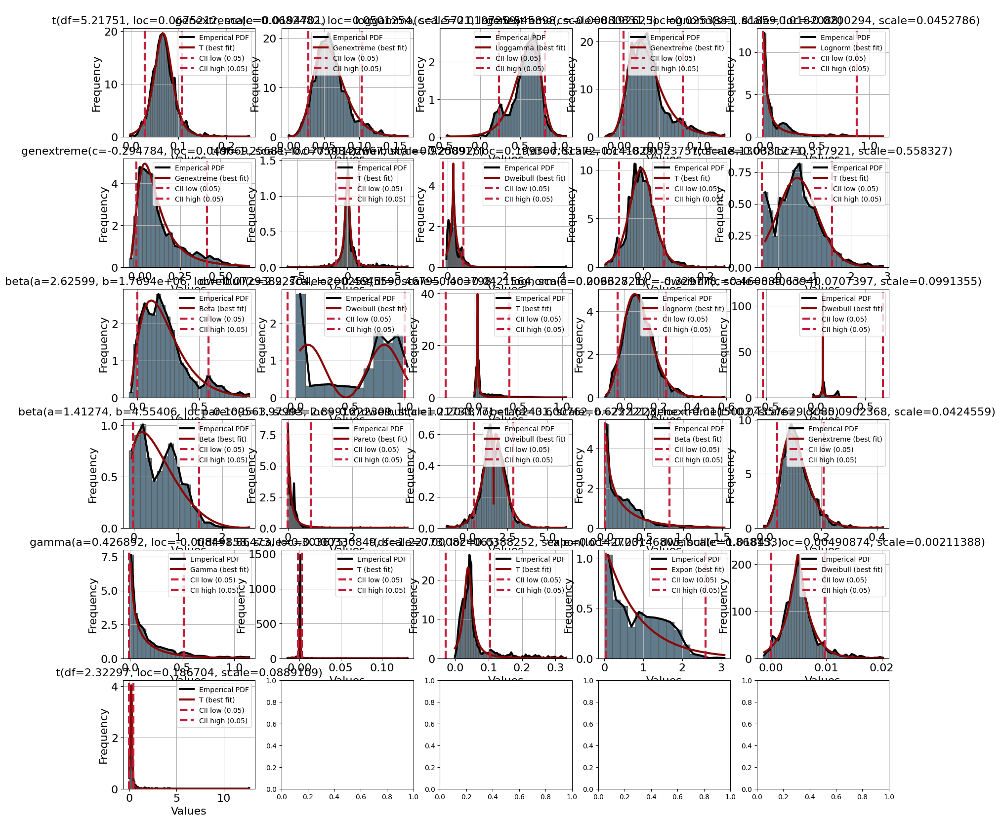

In [5]:
results_merged = list()
fig, ax = plt.subplots(6, 5, figsize=(20,20))
ax_idx = 0
for game in games:
    data = np.array([i for key in algo_bench.keys() for i in algo_bench[key][game]], dtype=float) # Mixes all data from all algorithms
    norm_data = score_normalization(data, RANDOM_SCORES[game], NORM_BASELINE[game])
    # Search for best theoretical fit on your empirical data
    dfit = distfit(todf=True, distr="popular", alpha=0.05)
    results_merged.append(dfit.fit_transform(norm_data))
    i, j = divmod(ax_idx, 5)
    ax_idx +=1
    dfit.plot(ax=ax[i, j])

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 236.939] [loc=0.075 scale=0.024]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 921.723] [loc=0.028 scale=0.047]
[distfit] >INFO> [pareto    ] [0.02 sec] [RSS: 921.723] [loc=-4194303.972 scale=4194304.000]
[distfit] >INFO> [dweibull  ] [0.02 sec] [RSS: 102.297] [loc=0.071 scale=0.018]
[distfit] >INFO> [t         ] [0.11 sec] [RSS: 72.0591] [loc=0.070 scale=0.015]
[distfit] >INFO> [genextreme] [0.17 sec] [RSS: 64.8395] [loc=0.064 scale=0.018]
[distfit] >INFO> [gamma     ] [0.08 sec] [RSS: 1259.76] [loc=0.028 scale=0.963]
[distfit] >INFO> [lognorm   ] [0.06 sec] [RSS: 77.6617] [loc=0.003 scale=0.068]
[distfit] >INFO> [beta      ] [0.10 sec] [RSS: 102.121] [loc=0.018 scale=52159.302]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 930.336] [loc=0.028 scale=0.147]
[distfit] >INFO> [loggamma  ] [0.11 sec] [RSS: 248.268] [loc=-10.975 scale=1.377]
[distfit] >INFO> fit
[distfit] >INFO> transform
[dist

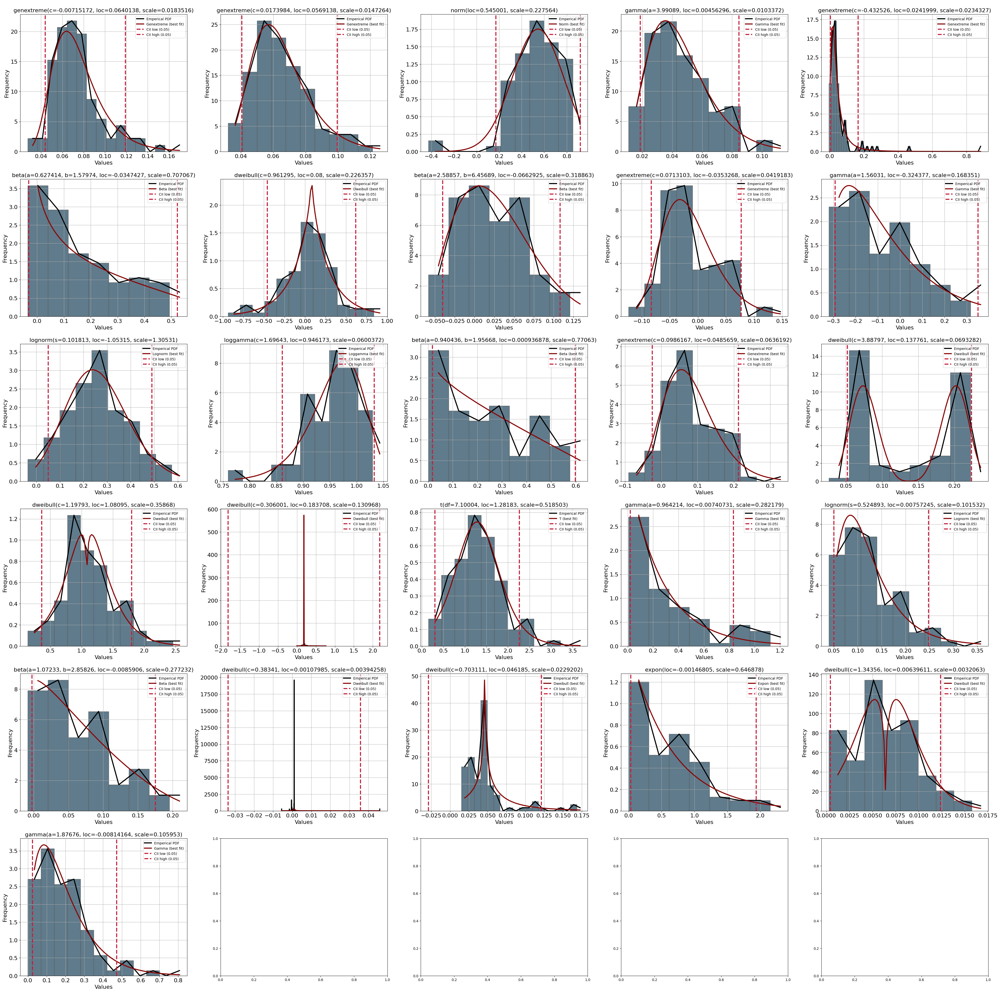

In [5]:
results = list()
fig, ax = plt.subplots(6, 5, figsize=(50,50))
ax_idx = 0
for game in games:
    data = np.array([i for i in algo_bench['CURL'][game]], dtype=float)
    norm_data = score_normalization(data, RANDOM_SCORES[game], NORM_BASELINE[game])
    # Search for best theoretical fit on your empirical data
    dfit = distfit(todf=True, distr="popular", alpha=0.05)
    results.append(dfit.fit_transform(norm_data))
    i, j = divmod(ax_idx, 5)
    ax_idx +=1
    dfit.plot(ax=ax[i, j])

In [6]:
results[0]['model']['model'].rvs(size=10)

array([0.06973286, 0.08431461, 0.11214117, 0.05496928, 0.05919351,
       0.09086908, 0.09021157, 0.06973774, 0.0644291 , 0.09567866])

# Data and distribution of games and algorithms (no merging)

In [7]:
results = list()
fig, ax = plt.subplots(26, 6, figsize=(50,8*26))
ax_idx = 0

for game in games:
    print(f"Summary of game {game} ---------------")
    for key in algo_bench.keys():

        data = np.array([i for i in algo_bench[key][game]], dtype=float)
        norm_data = score_normalization(data, RANDOM_SCORES[game], NORM_BASELINE[game])
        # Search for best theoretical fit on your empirical data
        dfit = distfit(todf=True, distr="popular", alpha=0.05, smooth=10, verbose=0)
        results.append(dfit.fit_transform(norm_data))
        i, j = divmod(ax_idx, 6)
        ax_idx +=1
        dfit.plot(ax=ax[i, j])
        print(dfit.summary)

Summary of game Alien ---------------
          name       score             loc         scale   
0     loggamma   117.92689      -10.974935       1.37691  \
1         norm   132.93567        0.074678      0.024319   
2      uniform  196.147948        0.027595      0.146785   
3         beta  231.579381        0.018042  52159.301683   
4      lognorm  276.660951        0.003019      0.068057   
5   genextreme  304.234791        0.064014      0.018352   
6       pareto  328.642634 -4194303.972405     4194304.0   
7        expon  328.642636        0.027595      0.047083   
8     dweibull  374.547409        0.070995      0.017586   
9        gamma  408.536715        0.027595      0.962949   
10           t  447.516991        0.070083      0.015415   

                                      arg   
0                    (3056.589942867311,)  \
1                                      ()   
2                                      ()   
3   (5.856962521293738, 5386183.99088795)   
4               

In [6]:

# with open('results_each_algo.pkl', 'wb') as outp:
#     pickle.dump(results, outp)

# with open('results_merged.pkl', 'wb') as outp:
#     pickle.dump(results_merged, outp)

In [5]:
with open('results_each_algo.pkl', 'rb') as file:
    results = pickle.load(file)


# Most common distributions

In [8]:
# Computes the  number of times a certain distribution appears within the dataset.
distr_lst = [i['model']['name'] for i in results_merged]
dt = dict(Counter(distr_lst))
ddt = dict()
for key, value in dt.items():
    ddt.update({key:value/len(distr_lst)})

# Resulting in the following most common occurrences
{'loggamma': 5,
 'uniform': 17,
 'genextreme': 0,
 'norm': 2,
 'beta': 1,
 'lognorm': 1,
 't': 0,
 'dweibull': 0}

In [13]:
results


[{'model': {'name': 'loggamma',
   'score': 117.92689046552913,
   'loc': -10.974935420666604,
   'scale': 1.376910234359947,
   'arg': (3056.589942867311,),
   'params': (3056.589942867311, -10.974935420666604, 1.376910234359947),
   'model': <scipy.stats._distn_infrastructure.rv_continuous_frozen at 0x1c315580df0>,
   'bootstrap_score': 0,
   'bootstrap_pass': None,
   'color': '#e41a1c',
   'CII_min_alpha': 0.03352387714375027,
   'CII_max_alpha': 0.11545986671702302},
  'summary':           name       score             loc         scale   
  0     loggamma   117.92689      -10.974935       1.37691  \
  1         norm   132.93567        0.074678      0.024319   
  2      uniform  196.147948        0.027595      0.146785   
  3         beta  231.579381        0.018042  52159.301683   
  4      lognorm  276.660951        0.003019      0.068057   
  5   genextreme  304.234791        0.064014      0.018352   
  6       pareto  328.642634 -4194303.972405     4194304.0   
  7        expon

# Generating a simulated dataset

In [4]:
with open('results_each_algo.pkl', 'rb') as file:
    results = pickle.load(file)

with open('results_merged.pkl', 'rb') as file:
    results_merged = pickle.load(file)


In [5]:
games = ['Alien', 'Amidar', 'Assault', 'Asterix', 'BankHeist', 'BattleZone', 'Boxing', 'Breakout', 'ChopperCommand', 'CrazyClimber', 'DemonAttack', 'Freeway', 'Frostbite', 'Gopher', 'Hero', 'Jamesbond', 'Kangaroo', 'Krull', 'KungFuMaster', 'MsPacman', 'Pong', 'PrivateEye', 'Qbert', 'RoadRunner', 'Seaquest', 'UpNDown']
distr_to_fun = {'t': stats.t, 'dweibull': stats.dweibull, 'expon': stats.expon, 'gamma': stats.gamma, 'genextreme': stats.genextreme, 'beta': stats.beta, 'pareto': stats.pareto, 'lognorm': stats.lognorm, 'loggamma': stats.loggamma}
results_merged_dict = dict(zip(games, results_merged))
algo_bench_distr = dict(zip(games, [distr_to_fun[res['model']['name']] for res in results_merged]))

Preparing a dataset with specific types of distributions. Once I have defined the dataset I can modify it enforcing a different location parameter for example. 

In [8]:
nsamples= 10
df = nsamples-1
weibull_coeff = 2 # allows bi-modal curves.
gamma_coeff = 1.5
genextreme_coeff = 0
beta_A = 1
beta_B = 2
pareto_coeff = 1
lognorm_coeff = 0.5
loggamma_coeff = 1.5
LOC = 0
SCALE = 1
games = ['Alien', 'Amidar', 'Assault', 'Asterix', 'BankHeist', 'BattleZone', 'Boxing', 'Breakout', 'ChopperCommand', 'CrazyClimber', 'DemonAttack', 'Freeway', 'Frostbite', 'Gopher', 'Hero', 'Jamesbond', 'Kangaroo', 'Krull', 'KungFuMaster', 'MsPacman', 'Pong', 'PrivateEye', 'Qbert', 'RoadRunner', 'Seaquest', 'UpNDown']
distr_to_fun = {
    "t": stats.t(df=df, loc = LOC, scale = SCALE),
    "dweibull": stats.dweibull(c= weibull_coeff, loc = LOC, scale = SCALE),
    "expon": stats.expon(loc = LOC, scale = SCALE),
    "gamma": stats.gamma(a= gamma_coeff, loc = LOC, scale = SCALE),
    "genextreme": stats.genextreme(c=genextreme_coeff, loc = LOC, scale = SCALE),
    "beta": stats.beta(a = beta_A, b = beta_B, loc = LOC, scale = SCALE),
    "pareto": stats.pareto(b = pareto_coeff, loc = LOC, scale = SCALE),
    "lognorm": stats.lognorm(s = lognorm_coeff, loc = LOC, scale = SCALE),
    "loggamma": stats.loggamma(c = loggamma_coeff, loc = LOC, scale = SCALE),
}
results_merged_dict = dict(zip(games, results_merged))
algo_bench_distr = dict(zip(games, [distr_to_fun[res['model']['name']] for res in results_merged]))
# for game in games:
#     print(algo_bench_distr[game].rvs(size = nsamples))

Il prossimo passaggio è fare il test di mack skillings. Ho però un problema. Non so calcolare, qui su Python, i valori critici. Per questo sto cercando di capire come ha fatto NSM3. 

In [6]:
# cMackSkil(0.05, 6, 26, 50)
cMackSkil(0.05, 2, 2, 100, method="Asymptotic")

{'stat.name': 'Mack-Skillings MS',
 'n.mc': 10000,
 'k': 2,
 'n': 2,
 'c': 100,
 'alpha': 0.05,
 'method': 'Asymptotic',
 'p_val': 3.841458820694124}

# False positive rate
Here we test what is the false positive rate when the sample is drawn from the same distribution.

In [16]:
df = nsamples-1
weibull_coeff = 2 # allows bi-modal curves.
gamma_coeff = 1.5
genextreme_coeff = 0
beta_A = 1
beta_B = 2
pareto_coeff = 1
lognorm_coeff = 0.5
loggamma_coeff = 1.5
LOC = 0
SCALE = 1
games = ['Alien', 'Amidar', 'Assault', 'Asterix', 'BankHeist', 'BattleZone', 'Boxing', 'Breakout', 'ChopperCommand', 'CrazyClimber', 'DemonAttack', 'Freeway', 'Frostbite', 'Gopher', 'Hero', 'Jamesbond', 'Kangaroo', 'Krull', 'KungFuMaster', 'MsPacman', 'Pong', 'PrivateEye', 'Qbert', 'RoadRunner', 'Seaquest', 'UpNDown']
distr_to_fun = {
    "t": stats.t(df=df, loc = LOC, scale = SCALE),
    "dweibull": stats.dweibull(c= weibull_coeff, loc = LOC, scale = SCALE),
    "expon": stats.expon(loc = LOC, scale = SCALE),
    "gamma": stats.gamma(a= gamma_coeff, loc = LOC, scale = SCALE),
    "genextreme": stats.genextreme(c=genextreme_coeff, loc = LOC, scale = SCALE),
    "beta": stats.beta(a = beta_A, b = beta_B, loc = LOC, scale = SCALE),
    "pareto": stats.pareto(b = pareto_coeff, loc = LOC, scale = SCALE),
    "lognorm": stats.lognorm(s = lognorm_coeff, loc = LOC, scale = SCALE),
    "loggamma": stats.loggamma(c = loggamma_coeff, loc = LOC, scale = SCALE),
}
results_merged_dict = dict(zip(games, results_merged))
algo_bench_distr = dict(zip(games, [distr_to_fun[res['model']['name']] for res in results_merged]))

In [15]:
# Same distribution
K = 2  # Number of treatments (i.e. number of algorithms)
N = 26  # Number of blocks (i.e. number of games)
C = 3 # number of datapoints for each treatment/block combination
num_obs = K * N * C
Nsim = 1000
MSv = np.zeros(Nsim)
Cs = list([1, 2, 3, 5, 10, 15, 20, 50])
Cs = list([10, 50])
fpos = np.zeros(len(Cs))
for g in range(len(Cs)):
    c = Cs[g]
    critical_value= cMackSkil(0.04, K, N, c, method="Asymptotic")['p_val']
    for f in range(Nsim):
        observ = np.zeros((N, K*C))
        for game, i in zip(games, range(N)):
            for j in range(K):
                if j == 1:
                    observ[i, j*C:j*C+C] = algo_bench_distr[game].rvs(size = C)
                else:
                    observ[i, j*C:j*C+C] = algo_bench_distr[game].rvs(size = C)

        ranks = stats.rankdata(observ, axis=1) # rank 1 corrisponde al valore piu' piccolo
        ranks = -np.add(ranks, -np.max(ranks+1)) # rank 1 adesso é il migliore

        avg_rank = np.zeros((N, K))
        for i in range(N):
            for j in range(K):
                avg_rank[i, j] = np.mean(ranks[i, j*C: j*C+C])

        S = np.mean(avg_rank, axis=0)*N
        MS = 12/(K*(num_obs+N))*np.sum(np.power(S,2)) -3*(num_obs+N)
        # print(f'Computed statistic: {MS} {"greater" if MS>critical_value else "smaller"} than critical value {critical_value}')
        MSv[f] = MS
    fpos[g] = np.sum(MSv>critical_value)/Nsim

TypeError: rvs() got an unexpected keyword argument 'scale'

In [14]:
fpos

array([0.053, 0.055, 0.054, 0.058, 0.05 , 0.058, 0.056, 0.053])

# False positive rate with different scale parameter

In [18]:
df = nsamples-1
weibull_coeff = 2 # allows bi-modal curves.
gamma_coeff = 1.5
genextreme_coeff = 0
beta_A = 1
beta_B = 2
pareto_coeff = 1
lognorm_coeff = 0.5
loggamma_coeff = 1.5
LOC = 0
SCALE = 1
games = ['Alien', 'Amidar', 'Assault', 'Asterix', 'BankHeist', 'BattleZone', 'Boxing', 'Breakout', 'ChopperCommand', 'CrazyClimber', 'DemonAttack', 'Freeway', 'Frostbite', 'Gopher', 'Hero', 'Jamesbond', 'Kangaroo', 'Krull', 'KungFuMaster', 'MsPacman', 'Pong', 'PrivateEye', 'Qbert', 'RoadRunner', 'Seaquest', 'UpNDown']
distr_to_fun = {
    "t": stats.t(df=df, loc = LOC, scale = SCALE),
    "dweibull": stats.dweibull(c= weibull_coeff, loc = LOC, scale = SCALE),
    "expon": stats.expon(loc = LOC, scale = SCALE),
    "gamma": stats.gamma(a= gamma_coeff, loc = LOC, scale = SCALE),
    "genextreme": stats.genextreme(c=genextreme_coeff, loc = LOC, scale = SCALE),
    "beta": stats.beta(a = beta_A, b = beta_B, loc = LOC, scale = SCALE),
    "pareto": stats.pareto(b = pareto_coeff, loc = LOC, scale = SCALE),
    "lognorm": stats.lognorm(s = lognorm_coeff, loc = LOC, scale = SCALE),
    "loggamma": stats.loggamma(c = loggamma_coeff, loc = LOC, scale = SCALE),
}

SCALE = 2
distr_to_fun_scaled = {
    "t": stats.t(df=df, loc = LOC, scale = SCALE),
    "dweibull": stats.dweibull(c= weibull_coeff, loc = LOC, scale = SCALE),
    "expon": stats.expon(loc = LOC, scale = SCALE),
    "gamma": stats.gamma(a= gamma_coeff, loc = LOC, scale = SCALE),
    "genextreme": stats.genextreme(c=genextreme_coeff, loc = LOC, scale = SCALE),
    "beta": stats.beta(a = beta_A, b = beta_B, loc = LOC, scale = SCALE),
    "pareto": stats.pareto(b = pareto_coeff, loc = LOC, scale = SCALE),
    "lognorm": stats.lognorm(s = lognorm_coeff, loc = LOC, scale = SCALE),
    "loggamma": stats.loggamma(c = loggamma_coeff, loc = LOC, scale = SCALE),
}
results_merged_dict = dict(zip(games, results_merged))
algo_bench_distr = dict(zip(games, [distr_to_fun[res['model']['name']] for res in results_merged]))
algo_bench_distr_scaled = dict(zip(games, [distr_to_fun_scaled[res['model']['name']] for res in results_merged]))

Mean algo1=-0.1483826645827233, Mean algo2=-0.11969959529105136
Mean algo1=0.7031407247135232, Mean algo2=0.8639428938921242
Mean algo1=-0.020078751714397526, Mean algo2=0.1727418123137594
Mean algo1=0.6292248151893929, Mean algo2=1.5609621574774777
Mean algo1=1.191775531444551, Mean algo2=2.066386142547353
Mean algo1=0.595470583713054, Mean algo2=1.5366641650758448
Mean algo1=-0.15148710875776106, Mean algo2=0.12926846266921563
Mean algo1=0.01719649104667265, Mean algo2=0.14879633650383695
Mean algo1=0.18341764924465054, Mean algo2=0.5018361316572888
Mean algo1=0.0940941528760984, Mean algo2=-0.3288442963035053
Mean algo1=0.30238357089362966, Mean algo2=0.7560249176666167
Mean algo1=0.011152753627954946, Mean algo2=-0.3858945374344709
Mean algo1=-0.05205641640033805, Mean algo2=0.08613391147847019
Mean algo1=1.1893655803744196, Mean algo2=2.3854624303415295
Mean algo1=0.05450218923662864, Mean algo2=-0.07213527123677484
Mean algo1=0.35338932993029365, Mean algo2=0.6579105240522416
Mea

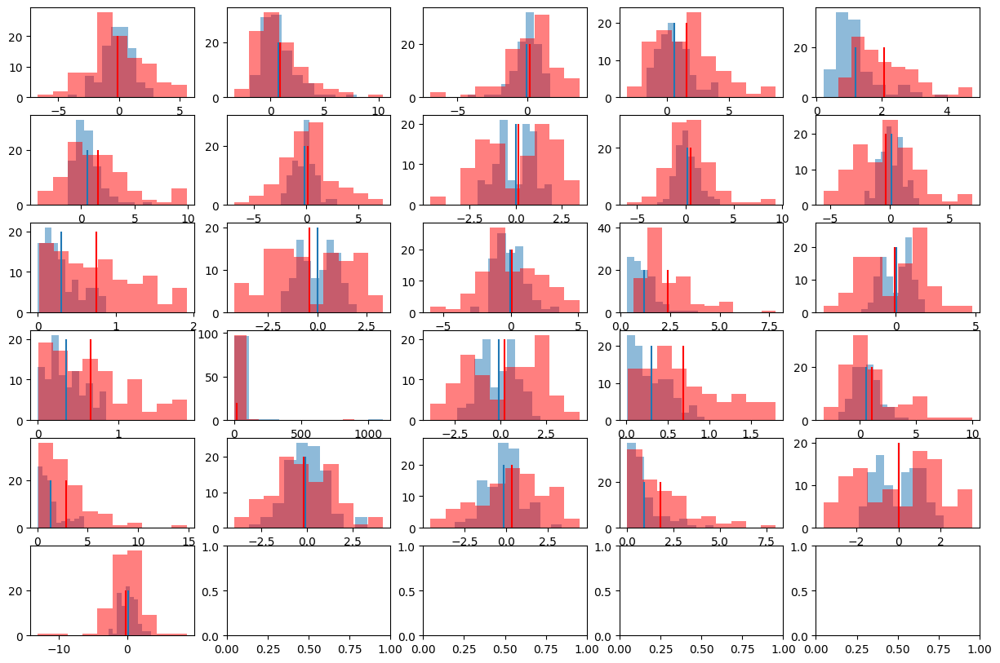

In [34]:
fig, ax = plt.subplots(6, 5, figsize=(15,10))
ax_idx = 0

for game in games:
    i, j = divmod(ax_idx, 5)
    ax_idx +=1
    data1 = algo_bench_distr[game].rvs(size = 100)
    data2 = algo_bench_distr_scaled[game].rvs(size = 100)
    ax[i, j].hist(data1, alpha=0.5)
    ax[i, j].vlines(np.mean(data1),0, 20)
    ax[i, j].hist(data2, color='red', alpha=0.5)
    ax[i, j].vlines(np.mean(data2),0, 20, color='red')

    print(f'Mean algo1={np.mean(data1)}, Mean algo2={np.mean(data2)}')
